<a href="https://colab.research.google.com/github/Nikhil5566/Data-Science-Portfolio-Projects/blob/main/Sleep%20%26%20Doomscrolling%20Habits%20Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Sleep & Doomscrolling Habits Dataset

# Unveiling the Night-Time Scroll: Insights from Sleep & Doomscrolling Habits
---
This dataset, comprising information from 1000 individuals, offers a fascinating glimpse into the intricate relationship between our digital habits, particularly doomscrolling, and the quality of our sleep. We've journeyed through this data, from initial exploration to building predictive models, uncovering several compelling insights along the way.

A Snapshot of Our Digital Nights:

Initially, we saw a dataset rich with details: demographic information (like age and gender), various screen time metrics (bedtime screen time, total daily screen time, doomscrolling session duration), and crucial sleep indicators (hours slept, latency, quality scores). Crucially, it also told us who identifies as a 'doomscroller' and who doesn't. We took care to clean the data, filling in any gaps in information about caffeine intake, sleep quality, or occupation, ensuring our analysis was robust.

Behavioral Patterns Emerge:

Our initial descriptive analysis revealed diverse patterns. For instance, 'scrolling social media' emerged as a dominant bedtime routine type, and a significant portion of individuals keep their phones in their bedrooms. We also observed a good balance between individuals who do and do not doomscroll, making it an ideal candidate for predictive modeling.

The Doomscrolling-Sleep Connection:

Moving into deeper statistical analysis, we discovered some telling relationships:

Doomscrolling's Impact: A key finding from our t-test was that there's a statistically significant difference in sleep hours per night between doomscrollers and non-doomscrollers. This suggests that doomscrolling isn't just a casual habit it directly correlates with how much sleep individuals get.
Screen Time's Shadow: Our linear regression model confirmed a negative relationship: as bedtime screen time minutes increase, the hours of sleep per night tend to decrease. This reinforces the common wisdom about limiting screen exposure before bed.
Occupation and Sleep Quality: We also found a statistically significant association between an individual's occupation status and their sleep quality category. This implies that certain professions or employment statuses might be linked to different levels of sleep quality.
Routine vs. Reality: Interestingly, our ANOVA test indicated no significant difference in sleep hours across different bedtime routine types (e.g., reading vs. watching videos). While routines are often touted for sleep, their specific type might not be the primary driver of total sleep hours in this context.

Predicting the Doomscroller:

Finally, to understand the collective impact of these factors, we built a machine learning model. After creating new features like 'screen time per sleep hour' and ensuring all variables were properly scaled and encoded, our Logistic Regression model successfully predicted an individual's 'doomscroller' status with an accuracy of 76.5%. This model showed a balanced performance in identifying both true doomscrollers and non-doomscrollers, demonstrating its utility in classifying individuals based on their digital and sleep habits.

In essence, this analysis paints a clear picture: our nighttime digital engagement, especially doomscrolling, is deeply intertwined with our sleep patterns. The insights gained can be invaluable for understanding the modern challenges to restful sleep and potentially for developing interventions.

---

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d harpartapsingh13/sleep-and-doomscrolling-habits-dataset

# Unziping the downloaded file
!unzip sleep-and-doomscrolling-habits-dataset.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/harpartapsingh13/sleep-and-doomscrolling-habits-dataset
License(s): CC0-1.0
100% 34.1k/34.1k [00:00<00:00, 24.7MB/s]

Archive:  sleep-and-doomscrolling-habits-dataset.zip
  inflating: sleep_doomscrolling_habits.csv  


In [ ]:
df = pd.read_csv('sleep_doomscrolling_habits.csv')
df.head(11)

,respondent_id,age,bedtime_screen_time_minutes,total_daily_screen_time_hours,doomscroll_sessions_per_night,avg_doomscroll_session_minutes,sleep_hours_per_night,sleep_latency_minutes,number_of_night_wakeups,caffeine_intake_mg_per_day,...,occupation_status,country_region,primary_device_used_at_night,bedtime_routine_type,uses_night_mode,keeps_phone_in_bedroom,consumes_negative_news_content,uses_sleep_tracking_app,doomscroller,sleep_quality_category
0,D30000,22,13.0,1.85,2,5.4,8.1,19.0,2,155.0,...,Unemployed,Germany,Tablet,Meditation/Journaling,Yes,Yes,Yes,No,Yes,Good
1,D30001,18,90.0,3.61,3,29.6,7.0,31.0,3,82.0,...,Student,India,Smartphone,Meditation/Journaling,No,Yes,Yes,No,Yes,Poor
2,D30002,37,51.0,5.15,3,15.5,7.1,24.0,2,49.0,...,Student,India,Laptop,Reading,No,Yes,No,Yes,Yes,Fair
3,D30003,27,53.0,3.74,0,51.4,8.4,35.0,0,42.0,...,NaN,United States,Smartphone,No Fixed Routine,No,Yes,Yes,No,No,Fair
4,D30004,17,67.0,6.09,2,32.2,7.2,19.0,1,76.0,...,Employed Part-time,United States,Smartphone,Watching Videos,No,No,No,No,No,Fair
5,D30005,21,81.0,5.20,4,19.5,7.9,39.0,2,61.0,...,Student,Nigeria,Smartphone,Watching Videos,No,Yes,No,No,Yes,Fair
6,D30006,34,56.0,3.75,3,18.7,8.8,45.0,1,166.0,...,Employed Full-time,Philippines,Smartphone,Scrolling Social Media,No,Yes,No,No,Yes,Good
7,D30007,26,40.0,2.41,3,13.7,7.7,36.0,2,54.0,...,Student,United Kingdom,Smartphone,Scrolling Social Media,Yes,Yes,Yes,Yes,Yes,Poor
8,D30008,32,77.0,3.38,4,19.2,7.8,29.0,1,127.0,...,Employed Full-time,Germany,Smartphone,Reading,Yes,Yes,No,No,Yes,Fair
9,D30009,34,23.0,2.46,2,7.8,6.4,18.0,3,97.0,...,Employed Full-time,Philippines,Tablet,Reading,No,No,No,No,No,Poor


In [ ]:
df.tail(11)

,respondent_id,age,bedtime_screen_time_minutes,total_daily_screen_time_hours,doomscroll_sessions_per_night,avg_doomscroll_session_minutes,sleep_hours_per_night,sleep_latency_minutes,number_of_night_wakeups,caffeine_intake_mg_per_day,...,occupation_status,country_region,primary_device_used_at_night,bedtime_routine_type,uses_night_mode,keeps_phone_in_bedroom,consumes_negative_news_content,uses_sleep_tracking_app,doomscroller,sleep_quality_category
989,D30989,32,52.0,5.24,2,30.2,7.2,32.0,0,278.0,...,Student,Australia,Smartphone,Scrolling Social Media,Yes,Yes,Yes,Yes,Yes,Poor
990,D30990,29,55.0,2.33,3,16.9,7.7,27.0,4,62.0,...,Unemployed,Germany,Tablet,Watching Videos,Yes,Yes,No,No,No,Fair
991,D30991,25,8.0,3.93,1,10.9,8.7,2.0,2,51.0,...,NaN,India,Smartphone,Meditation/Journaling,No,No,No,Yes,No,Good
992,D30992,31,37.0,3.40,2,20.8,7.7,28.0,0,97.0,...,Employed Part-time,India,Laptop,Reading,No,No,Yes,No,No,Good
993,D30993,26,13.0,1.00,1,18.6,7.8,14.0,1,66.0,...,Student,United States,Smartphone,No Fixed Routine,No,No,Yes,No,No,Good
994,D30994,23,21.0,2.83,2,11.1,7.2,33.0,1,79.0,...,Unemployed,UAE,Smartphone,Reading,No,No,No,Yes,No,Good
995,D30995,26,85.0,3.56,4,25.4,7.6,34.0,1,169.0,...,Student,India,Tablet,Meditation/Journaling,No,Yes,Yes,Yes,Yes,Poor
996,D30996,23,3.0,1.10,1,10.7,7.5,31.0,1,34.0,...,Student,United States,Smartphone,Scrolling Social Media,No,Yes,No,No,No,Fair
997,D30997,15,28.0,4.38,1,30.6,9.2,20.0,0,100.0,...,Employed Full-time,United States,Smartphone,Scrolling Social Media,No,Yes,No,No,No,Good
998,D30998,22,23.0,1.84,0,27.9,6.9,41.0,2,45.0,...,Student,India,Tablet,Watching Videos,No,Yes,Yes,Yes,No,Fair


## Seperating Numerical & Categorical Values:

In [ ]:
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()
categorical_cols = df.select_dtypes(include='object').columns.tolist()

print("Numerical Columns:")
for col in numerical_cols:
    print(f"- {col}")

print("\nCategorical Columns:")
for col in categorical_cols:
    print(f"- {col}")

Numerical Columns:
- age
- bedtime_screen_time_minutes
- total_daily_screen_time_hours
- doomscroll_sessions_per_night
- avg_doomscroll_session_minutes
- sleep_hours_per_night
- sleep_latency_minutes
- number_of_night_wakeups
- caffeine_intake_mg_per_day
- anxiety_score
- stress_score
- sleep_quality_score
- daytime_fatigue_score
- number_of_news_apps_used
- phone_checks_per_night
- exercise_minutes_per_day
- days_since_last_digital_detox
- weekly_sleep_debt_hours

Categorical Columns:
- respondent_id
- gender
- occupation_status
- country_region
- primary_device_used_at_night
- bedtime_routine_type
- uses_night_mode
- keeps_phone_in_bedroom
- consumes_negative_news_content
- uses_sleep_tracking_app
- doomscroller
- sleep_quality_category


In [ ]:
df.shape

(1000, 30)

In [ ]:
df.dtypes

,0
respondent_id,object
age,int64
bedtime_screen_time_minutes,float64
total_daily_screen_time_hours,float64
doomscroll_sessions_per_night,int64
avg_doomscroll_session_minutes,float64
sleep_hours_per_night,float64
sleep_latency_minutes,float64
number_of_night_wakeups,int64
caffeine_intake_mg_per_day,float64


In [ ]:
df.columns

Index(['respondent_id', 'age', 'bedtime_screen_time_minutes',
       'total_daily_screen_time_hours', 'doomscroll_sessions_per_night',
       'avg_doomscroll_session_minutes', 'sleep_hours_per_night',
       'sleep_latency_minutes', 'number_of_night_wakeups',
       'caffeine_intake_mg_per_day', 'anxiety_score', 'stress_score',
       'sleep_quality_score', 'daytime_fatigue_score',
       'number_of_news_apps_used', 'phone_checks_per_night',
       'exercise_minutes_per_day', 'days_since_last_digital_detox',
       'weekly_sleep_debt_hours', 'gender', 'occupation_status',
       'country_region', 'primary_device_used_at_night',
       'bedtime_routine_type', 'uses_night_mode', 'keeps_phone_in_bedroom',
       'consumes_negative_news_content', 'uses_sleep_tracking_app',
       'doomscroller', 'sleep_quality_category'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 30 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   respondent_id                   1000 non-null   object 
 1   age                             1000 non-null   int64  
 2   bedtime_screen_time_minutes     1000 non-null   float64
 3   total_daily_screen_time_hours   1000 non-null   float64
 4   doomscroll_sessions_per_night   1000 non-null   int64  
 5   avg_doomscroll_session_minutes  1000 non-null   float64
 6   sleep_hours_per_night           1000 non-null   float64
 7   sleep_latency_minutes           1000 non-null   float64
 8   number_of_night_wakeups         1000 non-null   int64  
 9   caffeine_intake_mg_per_day      950 non-null    float64
 10  anxiety_score                   1000 non-null   int64  
 11  stress_score                    1000 non-null   int64  
 12  sleep_quality_score             960

In [ ]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
respondent_id,1000,1000,D30999,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,1000.0,NaN,NaN,NaN,27.309,7.495312,15.0,21.75,27.0,33.0,54.0
bedtime_screen_time_minutes,1000.0,NaN,NaN,NaN,50.111,31.328136,1.0,27.0,44.0,66.0,225.0
total_daily_screen_time_hours,1000.0,NaN,NaN,NaN,3.66467,1.923755,1.0,2.23,3.345,4.785,12.95
doomscroll_sessions_per_night,1000.0,NaN,NaN,NaN,2.037,1.586237,0.0,1.0,2.0,3.0,10.0
avg_doomscroll_session_minutes,1000.0,NaN,NaN,NaN,24.9248,12.487106,1.0,16.7,22.6,30.925,90.0
sleep_hours_per_night,1000.0,NaN,NaN,NaN,7.4152,0.765751,4.0,6.9,7.4,7.9,9.8
sleep_latency_minutes,1000.0,NaN,NaN,NaN,27.882,14.510225,2.0,18.0,27.0,37.0,90.0
number_of_night_wakeups,1000.0,NaN,NaN,NaN,1.412,1.172019,0.0,1.0,1.0,2.0,6.0
caffeine_intake_mg_per_day,950.0,NaN,NaN,NaN,120.752632,81.978478,3.0,61.0,102.0,166.0,600.0


In [ ]:
df.isnull().sum()

,0
respondent_id,0
age,0
bedtime_screen_time_minutes,0
total_daily_screen_time_hours,0
doomscroll_sessions_per_night,0
avg_doomscroll_session_minutes,0
sleep_hours_per_night,0
sleep_latency_minutes,0
number_of_night_wakeups,0
caffeine_intake_mg_per_day,50


In [ ]:
df.duplicated().sum()

np.int64(0)

## Data Cleaning and Preprocessing

In [ ]:
# Dropping 'respondent_id' as it's a unique identifier and not useful for analysis
df_cleaned = df.drop(columns=['respondent_id']).copy()

In [ ]:
# Impute numerical missing values with the median

numerical_cols_with_nulls = df_cleaned.select_dtypes(include=np.number).columns[df_cleaned.select_dtypes(include=np.number).isnull().any()].tolist()

for col in numerical_cols_with_nulls:
    median_val = df_cleaned[col].median()
    df_cleaned[col].fillna(median_val, inplace=True)
    print(f"Imputed numerical column '{col}' with median: {median_val}")

# Impute categorical missing values with the mode
categorical_cols_with_nulls = df_cleaned.select_dtypes(include='object').columns[df_cleaned.select_dtypes(include='object').isnull().any()].tolist()
for col in categorical_cols_with_nulls:
    mode_val = df_cleaned[col].mode()[0] # .mode() can return multiple values, take the first
    df_cleaned[col].fillna(mode_val, inplace=True)
    print(f"Imputed categorical column '{col}' with mode: {mode_val}")

print("\nMissing values after imputation:")
print(df_cleaned.isnull().sum().sum())

Imputed numerical column 'caffeine_intake_mg_per_day' with median: 102.0
Imputed numerical column 'sleep_quality_score' with median: 5.0
Imputed numerical column 'exercise_minutes_per_day' with median: 54.0
Imputed categorical column 'occupation_status' with mode: Employed Full-time
Imputed categorical column 'primary_device_used_at_night' with mode: Smartphone
Imputed categorical column 'bedtime_routine_type' with mode: Scrolling Social Media

Missing values after imputation:
0


In [ ]:
# Converting 'Yes'/'No' columns to 1/0 numerical representation

bool_cols = ['uses_night_mode', 'keeps_phone_in_bedroom', 'consumes_negative_news_content', 'uses_sleep_tracking_app', 'doomscroller']

for col in bool_cols:
    if col in df_cleaned.columns:
        df_cleaned[col] = df_cleaned[col].map({'Yes': 1, 'No': 0})
        print(f"Converted '{col}' to numerical (1/0).")

print("\nUpdated DataFrame info after cleaning:")
df_cleaned.info()
display(df_cleaned.head())

Converted 'uses_night_mode' to numerical (1/0).
Converted 'keeps_phone_in_bedroom' to numerical (1/0).
Converted 'consumes_negative_news_content' to numerical (1/0).
Converted 'uses_sleep_tracking_app' to numerical (1/0).
Converted 'doomscroller' to numerical (1/0).

Updated DataFrame info after cleaning:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 29 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   age                             1000 non-null   int64  
 1   bedtime_screen_time_minutes     1000 non-null   float64
 2   total_daily_screen_time_hours   1000 non-null   float64
 3   doomscroll_sessions_per_night   1000 non-null   int64  
 4   avg_doomscroll_session_minutes  1000 non-null   float64
 5   sleep_hours_per_night           1000 non-null   float64
 6   sleep_latency_minutes           1000 non-null   float64
 7   number_of_night_wakeups         1

,age,bedtime_screen_time_minutes,total_daily_screen_time_hours,doomscroll_sessions_per_night,avg_doomscroll_session_minutes,sleep_hours_per_night,sleep_latency_minutes,number_of_night_wakeups,caffeine_intake_mg_per_day,anxiety_score,...,occupation_status,country_region,primary_device_used_at_night,bedtime_routine_type,uses_night_mode,keeps_phone_in_bedroom,consumes_negative_news_content,uses_sleep_tracking_app,doomscroller,sleep_quality_category
0,22,13.0,1.85,2,5.4,8.1,19.0,2,155.0,5,...,Unemployed,Germany,Tablet,Meditation/Journaling,1,1,1,0,1,Good
1,18,90.0,3.61,3,29.6,7.0,31.0,3,82.0,5,...,Student,India,Smartphone,Meditation/Journaling,0,1,1,0,1,Poor
2,37,51.0,5.15,3,15.5,7.1,24.0,2,49.0,2,...,Student,India,Laptop,Reading,0,1,0,1,1,Fair
3,27,53.0,3.74,0,51.4,8.4,35.0,0,42.0,6,...,Employed Full-time,United States,Smartphone,No Fixed Routine,0,1,1,0,0,Fair
4,17,67.0,6.09,2,32.2,7.2,19.0,1,76.0,5,...,Employed Part-time,United States,Smartphone,Watching Videos,0,0,0,0,0,Fair


# Descriptive Analysis

## Univariate Analysis

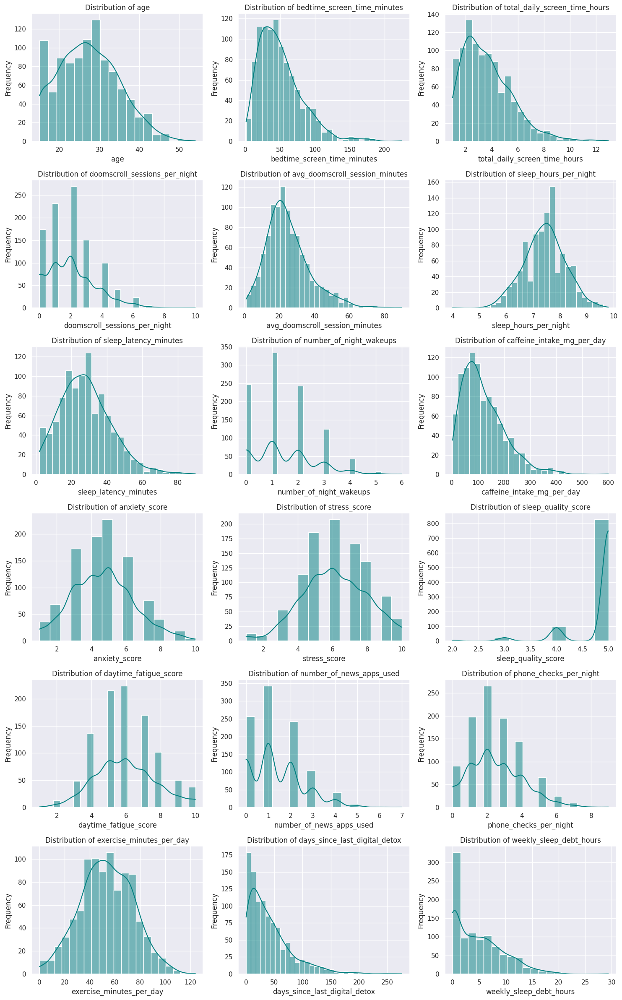

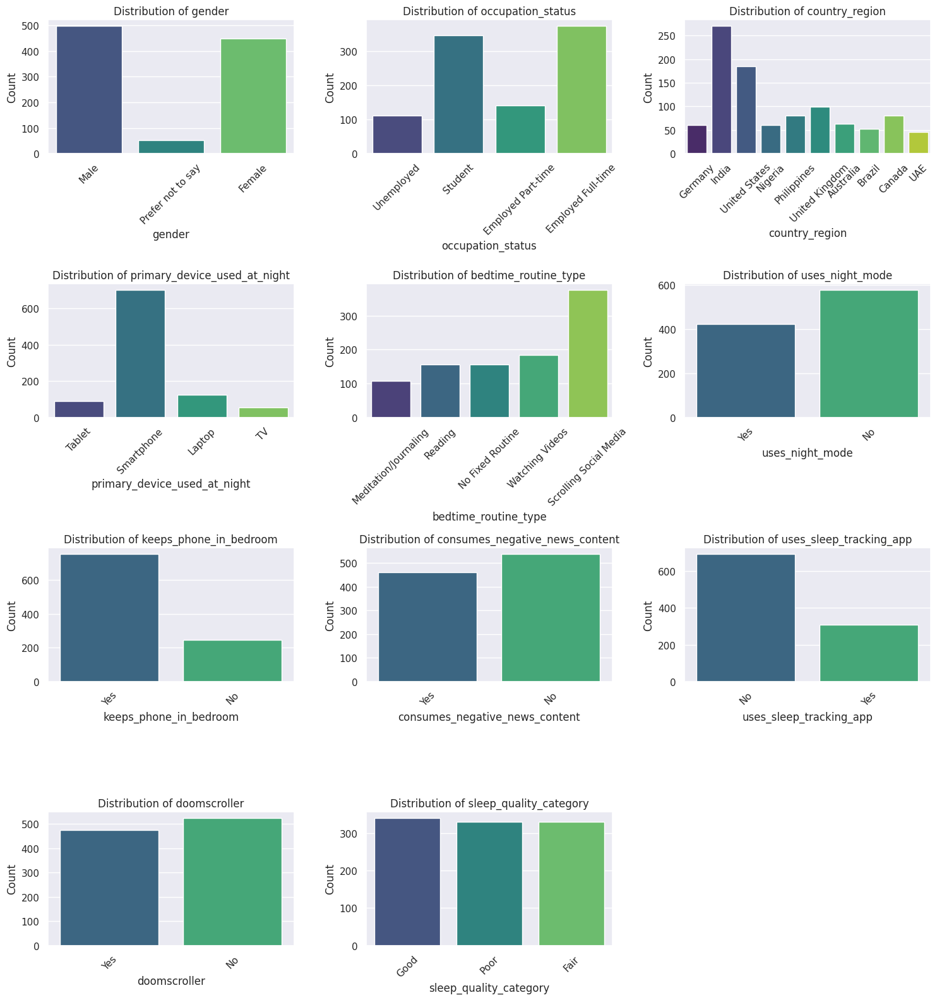

--- Categorical Value Counts ---

Value counts for gender:
gender
Male                 497
Female               450
Prefer not to say     53
Name: count, dtype: int64

Value counts for occupation_status:
occupation_status
Employed Full-time    373
Student               346
Employed Part-time    140
Unemployed            111
Name: count, dtype: int64

Value counts for country_region:
country_region
India             270
United States     185
United Kingdom     99
Philippines        81
Canada             81
Australia          63
Germany            61
Nigeria            61
Brazil             53
UAE                46
Name: count, dtype: int64

Value counts for primary_device_used_at_night:
primary_device_used_at_night
Smartphone    701
Laptop        124
Tablet         90
TV             55
Name: count, dtype: int64

Value counts for bedtime_routine_type:
bedtime_routine_type
Scrolling Social Media    375
Watching Videos           184
Reading                   157
No Fixed Routine          1

In [ ]:
import math

# --- 1. Numerical Columns (Histograms in a Grid) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

if len(numerical_cols) > 0:
    # Defining grid size
    num_plots = len(numerical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterating and plot
    for i, col in enumerate(numerical_cols):
        sns.histplot(data=df, x=col, kde=True, ax=axes[i], color='teal') # Added color
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')

    # Hiding any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No numerical columns found.")


# --- 2. Categorical Columns (Countplots in a Grid) ---
# Filtering out columns with too many unique values (like IDs) to avoid messy plots
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 20]

if len(categorical_cols) > 0:
    # Defining grid size
    num_plots = len(categorical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterating and plot
    for i, col in enumerate(categorical_cols):
        sns.countplot(data=df, x=col, ax=axes[i], palette='viridis', hue=col, legend=False) # Added palette
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Count')
        axes[i].tick_params(axis='x', rotation=45)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

     # --- 3. Value Counts (Text Output) ---
    print("--- Categorical Value Counts ---")
    for col in categorical_cols:
        print(f"\nValue counts for {col}:")
        print(df[col].value_counts())
else:
    print("No categorical columns found (or all have high cardinality).")

## Bivariate Analysis

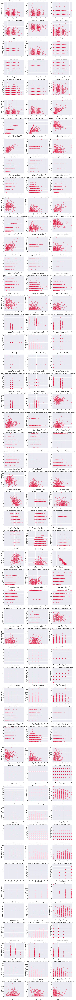

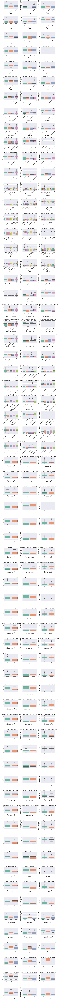

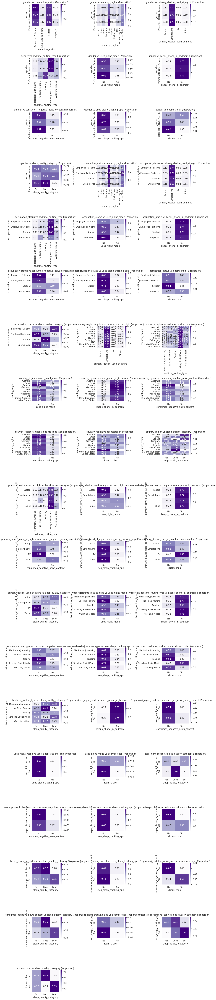

In [ ]:
import itertools

# --- 1. Numerical-Numerical Relationships (Scatter Plots) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generating all unique pairs of numerical columns
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(num_pairs) > 0:
    # Defining grid size
    num_plots = len(num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterating through pairs and plot
    for i, (col1, col2) in enumerate(num_pairs):
        sns.scatterplot(data=df, x=col1, y=col2, ax=axes[i], alpha=0.5, color='crimson') # Added color
        axes[i].set_title(f'{col1} vs {col2}')
        axes[i].set_xlabel(col1)
        axes[i].set_ylabel(col2)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Not enough numerical columns for scatter plots.")


# --- 2. Categorical-Numerical Relationships (Box Plots) ---
# Excluding high cardinality columns
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 20]
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generating all pairs of (Categorical, Numerical)
cat_num_pairs = list(itertools.product(categorical_cols, numerical_cols))

if len(cat_num_pairs) > 0:
    # Defining grid size
    num_plots = len(cat_num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterating through pairs and plot
    for i, (cat_col, num_col) in enumerate(cat_num_pairs):
        sns.boxplot(data=df, x=cat_col, y=num_col, ax=axes[i], palette='Set2', hue=cat_col, legend=False)
        axes[i].set_title(f'{num_col} by {cat_col}')
        axes[i].set_xlabel(cat_col)
        axes[i].set_ylabel(num_col)
        axes[i].tick_params(axis='x', rotation=45)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No categorical-numerical pairs found.")


# --- 3. Categorical-Categorical Relationships (Heatmaps) ---
# Generating pairs of categorical columns
cat_pairs = list(itertools.combinations(categorical_cols, 2))

if len(cat_pairs) > 0:
    num_plots = len(cat_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for i, (col1, col2) in enumerate(cat_pairs):
        # Creating a cross-tabulation
        crosstab = pd.crosstab(df[col1], df[col2], normalize='index')
        sns.heatmap(crosstab, annot=True, fmt='.2f', cmap='Purples', ax=axes[i])
        axes[i].set_title(f'{col1} vs {col2} (Proportion)')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

## Multivariate Analysis - Too big for Github to upload this projet

In [ ]:
'''import itertools
import math

# --- Multivariate Analysis: Numerical Pairs with Categorical Hue ---

# 1. Identifying valid columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()
# Filtering categorical columns to those with few unique values for clear legends (e.g., < 10)
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 10]

# Generating pairs of numerical columns to plot
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(numerical_cols) > 1 and len(categorical_cols) > 0:
    # OUTER LOOP: Iterating through each categorical variable to use as the 'Hue'
    for cat_col in categorical_cols:
        print(f"\nAnalyzing relationships with Hue: {cat_col}...")

        # Defining grid size for the inner loop (numerical pairs)
        num_plots = len(num_pairs)
        num_cols_plot = 3
        num_rows_plot = math.ceil(num_plots / num_cols_plot)

        # Creating figure
        fig, axes = plt.subplots(num_rows_plot, num_cols_plot, figsize=(15, 4 * num_rows_plot))
        if num_plots > 1:
             axes = axes.flatten()
        else:
             axes = [axes]

        # INNER LOOP: Iterating through numerical pairs
        for i, (num1, num2) in enumerate(num_pairs):
            sns.scatterplot(data=df, x=num1, y=num2, hue=cat_col, ax=axes[i], alpha=0.6)
            axes[i].set_title(f'{num1} vs {num2}')

        # Hiding unused subplots
        for j in range(i + 1, len(axes)):
            axes[j].axis('off')

        plt.suptitle(f'Multivariate Analysis: Colored by {cat_col}', y=1.02, fontsize=16)
        plt.tight_layout()
        plt.show()
        print("="*80)
else:
    print("Not enough data for multivariate scatter analysis (need >1 numerical and >0 categorical columns).")'''

'import itertools\nimport math\n\n# --- Multivariate Analysis: Numerical Pairs with Categorical Hue ---\n\n# 1. Identifying valid columns\nnumerical_cols = df.select_dtypes(include=np.number).columns.tolist()\n# Filtering categorical columns to those with few unique values for clear legends (e.g., < 10)\ncategorical_cols = [c for c in df.select_dtypes(include=\'object\').columns if df[c].nunique() < 10]\n\n# Generating pairs of numerical columns to plot\nnum_pairs = list(itertools.combinations(numerical_cols, 2))\n\nif len(numerical_cols) > 1 and len(categorical_cols) > 0:\n    # OUTER LOOP: Iterating through each categorical variable to use as the \'Hue\'\n    for cat_col in categorical_cols:\n        print(f"\nAnalyzing relationships with Hue: {cat_col}...")\n\n        # Defining grid size for the inner loop (numerical pairs)\n        num_plots = len(num_pairs)\n        num_cols_plot = 3\n        num_rows_plot = math.ceil(num_plots / num_cols_plot)\n\n        # Creating figure\n     

## Pair-plot

## Correlation Analysis

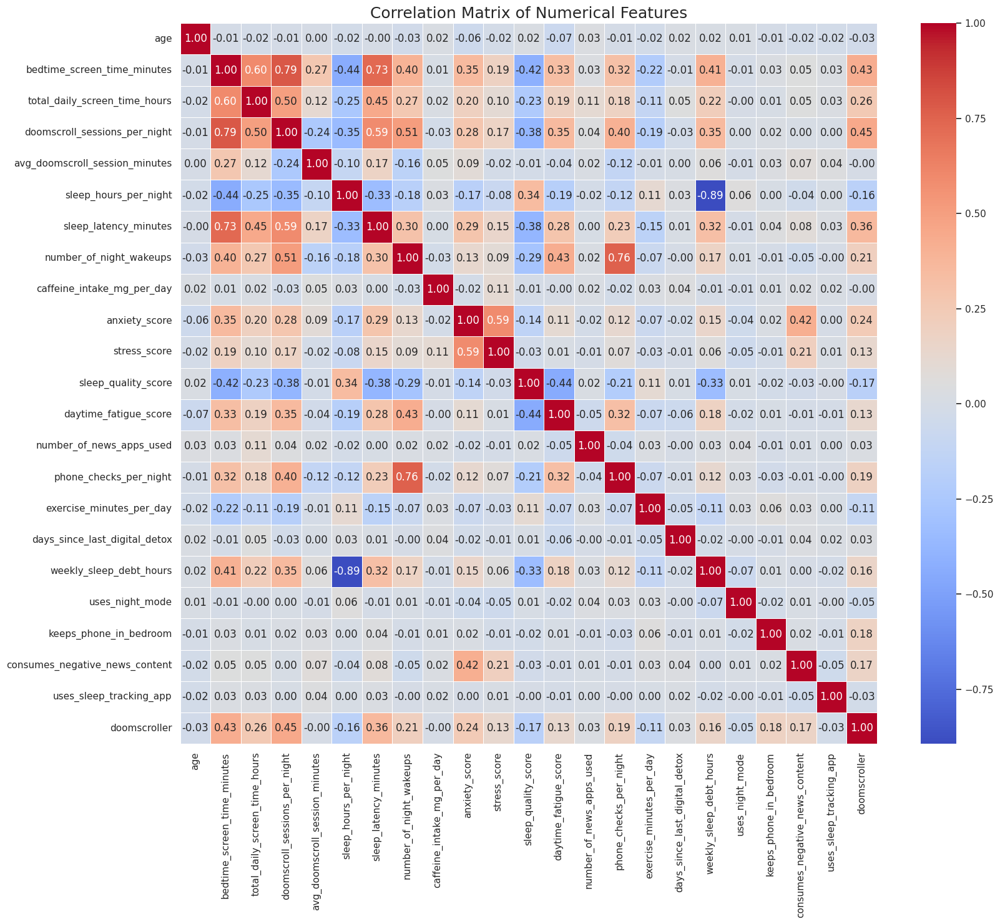

In [ ]:
numerical_cols_cleaned = df_cleaned.select_dtypes(include=np.number).columns.tolist()

plt.figure(figsize=(18, 15))
sns.heatmap(df_cleaned[numerical_cols_cleaned].corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
plt.title('Correlation Matrix of Numerical Features', fontsize=18)
plt.show()

## Comprehensive Descriptive Analysis on Cleaned Data

### 1. Statistical Summaries

In [ ]:
print('Descriptive statistics for numerical columns:')
display(df_cleaned.describe().T)

Descriptive statistics for numerical columns:


,count,mean,std,min,25%,50%,75%,max
age,1000.0,27.30900,7.495312,15.0,21.750,27.000,33.000,54.00
bedtime_screen_time_minutes,1000.0,50.11100,31.328136,1.0,27.000,44.000,66.000,225.00
total_daily_screen_time_hours,1000.0,3.66467,1.923755,1.0,2.230,3.345,4.785,12.95
doomscroll_sessions_per_night,1000.0,2.03700,1.586237,0.0,1.000,2.000,3.000,10.00
avg_doomscroll_session_minutes,1000.0,24.92480,12.487106,1.0,16.700,22.600,30.925,90.00
sleep_hours_per_night,1000.0,7.41520,0.765751,4.0,6.900,7.400,7.900,9.80
sleep_latency_minutes,1000.0,27.88200,14.510225,2.0,18.000,27.000,37.000,90.00
number_of_night_wakeups,1000.0,1.41200,1.172019,0.0,1.000,1.000,2.000,6.00
caffeine_intake_mg_per_day,1000.0,119.81500,80.005197,3.0,63.000,102.000,163.000,600.00
anxiety_score,1000.0,4.64400,1.792338,1.0,3.000,5.000,6.000,10.00


In [ ]:
print('Descriptive statistics for categorical columns:')
display(df_cleaned.describe(include='object').T)

Descriptive statistics for categorical columns:


,count,unique,top,freq
gender,1000,3,Male,497
occupation_status,1000,4,Employed Full-time,403
country_region,1000,10,India,270
primary_device_used_at_night,1000,4,Smartphone,731
bedtime_routine_type,1000,5,Scrolling Social Media,395
sleep_quality_category,1000,3,Good,340


## Inferential Analysis

### 1. Hypothesis Testing: Independent Samples t-test

This test is used to determine if there is a statistically significant difference between the means of two independent groups for a numerical variable. Here, we'll test if there's a significant difference in `sleep_hours_per_night` between `doomscrollers` (1) and non-`doomscrollers` (0).

In [ ]:
from scipy import stats

doomscrollers = df_cleaned[df_cleaned['doomscroller'] == 1]['sleep_hours_per_night']
non_doomscrollers = df_cleaned[df_cleaned['doomscroller'] == 0]['sleep_hours_per_night']

# Perform independent t-test
t_stat, p_value = stats.ttest_ind(doomscrollers, non_doomscrollers, equal_var=False) # Assuming unequal variances

print(f"T-statistic: {t_stat:.3f}")
print(f"P-value: {p_value:.3f}")

if p_value < 0.05:
    print("Conclusion: There is a statistically significant difference in sleep hours per night between doomscrollers and non-doomscrollers.")
else:
    print("Conclusion: There is no statistically significant difference in sleep hours per night between doomscrollers and non-doomscrollers.")

T-statistic: -5.138
P-value: 0.000
Conclusion: There is a statistically significant difference in sleep hours per night between doomscrollers and non-doomscrollers.


### 2. Regression Analysis: Simple Linear Regression

Linear regression models the relationship between a dependent variable and one or more independent variables by fitting a linear equation to the observed data. Here, we'll examine how `bedtime_screen_time_minutes` might predict `sleep_hours_per_night`.

In [ ]:
import statsmodels.formula.api as smf

# Define the regression model formula
model_formula = 'sleep_hours_per_night ~ bedtime_screen_time_minutes'

# Fit the OLS (Ordinary Least Squares) model
model = smf.ols(formula=model_formula, data=df_cleaned).fit()

# Print the summary of the regression results
print(model.summary())

                              OLS Regression Results                             
Dep. Variable:     sleep_hours_per_night   R-squared:                       0.191
Model:                               OLS   Adj. R-squared:                  0.190
Method:                    Least Squares   F-statistic:                     235.2
Date:                   Thu, 30 Jul 2026   Prob (F-statistic):           8.11e-48
Time:                           17:26:04   Log-Likelihood:                -1045.8
No. Observations:                   1000   AIC:                             2096.
Df Residuals:                        998   BIC:                             2105.
Df Model:                              1                                         
Covariance Type:               nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------

### 3. Relationship between Categorical Variables: Chi-Squared Test

The Chi-Squared test of independence is used to determine if there is a significant association between two categorical variables. We will test if `occupation_status` is independent of `sleep_quality_category`.

In [ ]:
from scipy.stats import chi2_contingency

# Create a contingency table
contingency_table = pd.crosstab(df_cleaned['occupation_status'], df_cleaned['sleep_quality_category'])

# Perform the Chi-Squared test
chi2, p, dof, expected = chi2_contingency(contingency_table)

print("Chi-Squared Statistic:", chi2)
print("P-value:", p)
print("Degrees of Freedom:", dof)
print("Expected Frequencies Table:\n", pd.DataFrame(expected, columns=contingency_table.columns, index=contingency_table.index))

if p < 0.05:
    print("Conclusion: There is a statistically significant association between occupation status and sleep quality category.")
else:
    print("Conclusion: There is no statistically significant association between occupation status and sleep quality category.")

Chi-Squared Statistic: 13.861904296499727
P-value: 0.03121739097309025
Degrees of Freedom: 6
Expected Frequencies Table:
 sleep_quality_category    Fair    Good    Poor
occupation_status                             
Employed Full-time      132.99  137.02  132.99
Employed Part-time       46.20   47.60   46.20
Student                 114.18  117.64  114.18
Unemployed               36.63   37.74   36.63
Conclusion: There is a statistically significant association between occupation status and sleep quality category.


### 4. Comparing Means of Multiple Groups: One-Way ANOVA

One-Way Analysis of Variance (ANOVA) is used to determine whether there are any statistically significant differences between the means of three or more independent (unrelated) groups. We'll use it to see if `sleep_hours_per_night` differs significantly across different `bedtime_routine_type` categories.

In [ ]:
from scipy.stats import f_oneway

# Get the unique bedtime routine types
routine_types = df_cleaned['bedtime_routine_type'].unique()

# Create a list of sleep hours for each routine type
data_to_anova = [df_cleaned[df_cleaned['bedtime_routine_type'] == routine]['sleep_hours_per_night'] for routine in routine_types]

# Perform one-way ANOVA
f_statistic, p_value = f_oneway(*data_to_anova)

print(f"F-statistic: {f_statistic:.3f}")
print(f"P-value: {p_value:.3f}")

if p_value < 0.05:
    print("Conclusion: There is a statistically significant difference in sleep hours per night among different bedtime routine types.")
else:
    print("Conclusion: There is no statistically significant difference in sleep hours per night among different bedtime routine types.")

F-statistic: 0.411
P-value: 0.801
Conclusion: There is no statistically significant difference in sleep hours per night among different bedtime routine types.


# Feature Engineering

This section focuses on creating new features or transforming existing ones to potentially improve the performance of machine learning models or provide deeper insights into the data.

### 1. Creating Interaction/Ratio Features

We create new features by combining existing ones if we suspect a meaningful interaction. For example, a ratio of screen time to sleep hours might be a good indicator.

In [ ]:
# Create a new feature: screen_time_per_sleep_hour
# Add a small constant to sleep_hours_per_night to avoid division by zero
df_cleaned['screen_time_per_sleep_hour'] = df_cleaned['bedtime_screen_time_minutes'] / (df_cleaned['sleep_hours_per_night'] * 60 + 1) # Convert sleep hours to minutes

# Create a new feature: caffeine_per_age (e.g., how caffeine intake relates to age)
df_cleaned['caffeine_per_age'] = df_cleaned['caffeine_intake_mg_per_day'] / (df_cleaned['age'] + 1)

print("New features created:")
display(df_cleaned[['bedtime_screen_time_minutes', 'sleep_hours_per_night', 'screen_time_per_sleep_hour', 'caffeine_intake_mg_per_day', 'age', 'caffeine_per_age']].head())

New features created:


,bedtime_screen_time_minutes,sleep_hours_per_night,screen_time_per_sleep_hour,caffeine_intake_mg_per_day,age,caffeine_per_age
0,13.0,8.1,0.026694,155.0,22,6.739130
1,90.0,7.0,0.213777,82.0,18,4.315789
2,51.0,7.1,0.119438,49.0,37,1.289474
3,53.0,8.4,0.104950,42.0,27,1.500000
4,67.0,7.2,0.154734,76.0,17,4.222222


### 2. Encoding Categorical Variables

Most machine learning models require numerical input. We'll use One-Hot Encoding for categorical variables that do not have an inherent ordinal relationship.

In [ ]:
# Identifying categorical columns that need encoding
categorical_cols_to_encode = df_cleaned.select_dtypes(include='object').columns.tolist()

print(f"Categorical columns to encode: {categorical_cols_to_encode}")

# Performing One-Hot Encoding
df_encoded = pd.get_dummies(df_cleaned, columns=categorical_cols_to_encode, drop_first=True, dtype=int)

print("\nDataFrame after One-Hot Encoding:")
df_encoded.info()
display(df_encoded.head())

Categorical columns to encode: ['gender', 'occupation_status', 'country_region', 'primary_device_used_at_night', 'bedtime_routine_type', 'sleep_quality_category']

DataFrame after One-Hot Encoding:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 48 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   age                                          1000 non-null   int64  
 1   bedtime_screen_time_minutes                  1000 non-null   float64
 2   total_daily_screen_time_hours                1000 non-null   float64
 3   doomscroll_sessions_per_night                1000 non-null   int64  
 4   avg_doomscroll_session_minutes               1000 non-null   float64
 5   sleep_hours_per_night                        1000 non-null   float64
 6   sleep_latency_minutes                        1000 non-null   float64
 7   number_of_night_wakeups  

,age,bedtime_screen_time_minutes,total_daily_screen_time_hours,doomscroll_sessions_per_night,avg_doomscroll_session_minutes,sleep_hours_per_night,sleep_latency_minutes,number_of_night_wakeups,caffeine_intake_mg_per_day,anxiety_score,...,country_region_United States,primary_device_used_at_night_Smartphone,primary_device_used_at_night_TV,primary_device_used_at_night_Tablet,bedtime_routine_type_No Fixed Routine,bedtime_routine_type_Reading,bedtime_routine_type_Scrolling Social Media,bedtime_routine_type_Watching Videos,sleep_quality_category_Good,sleep_quality_category_Poor
0,22,13.0,1.85,2,5.4,8.1,19.0,2,155.0,5,...,0,0,0,1,0,0,0,0,1,0
1,18,90.0,3.61,3,29.6,7.0,31.0,3,82.0,5,...,0,1,0,0,0,0,0,0,0,1
2,37,51.0,5.15,3,15.5,7.1,24.0,2,49.0,2,...,0,0,0,0,0,1,0,0,0,0
3,27,53.0,3.74,0,51.4,8.4,35.0,0,42.0,6,...,1,1,0,0,1,0,0,0,0,0
4,17,67.0,6.09,2,32.2,7.2,19.0,1,76.0,5,...,1,1,0,0,0,0,0,1,0,0


### 3. Feature Scaling

Feature scaling (e.g., Standardization or Normalization) is often performed after feature engineering, especially for models sensitive to the scale of input features (like SVMs, K-Nearest Neighbors, or neural networks). We'll use StandardScaler for this example.

In [ ]:
from sklearn.preprocessing import StandardScaler

# Separate features (X) and target (y) BEFORE scaling, to ensure target remains unscaled
X_pre_scale = df_encoded.drop('doomscroller', axis=1)
y_target = df_encoded['doomscroller'] # This will be 0/1

# Identify numerical columns in X_pre_scale for scaling
numerical_cols_for_scaling = X_pre_scale.select_dtypes(include=np.number).columns.tolist()

# Initialize the StandardScaler
scaler = StandardScaler()

# Apply scaling only to the numerical features in X_pre_scale
X_scaled_array = scaler.fit_transform(X_pre_scale[numerical_cols_for_scaling])

# Create a DataFrame for scaled features, maintaining original index and column names
X_scaled_df = pd.DataFrame(X_scaled_array, columns=numerical_cols_for_scaling, index=X_pre_scale.index)

# For non-numerical columns (e.g., one-hot encoded categorical) that were not scaled, add them back to X_scaled_df
# Use .difference to get columns that were in X_pre_scale but not in numerical_cols_for_scaling
non_scaled_feature_cols = X_pre_scale.columns.difference(numerical_cols_for_scaling)
X_scaled_df = pd.concat([X_scaled_df, X_pre_scale[non_scaled_feature_cols]], axis=1)

# Reconstruct df_scaled by adding the original (unscaled) target variable back
df_scaled = pd.concat([X_scaled_df, y_target], axis=1)

# Ensure column order for consistency, placing 'doomscroller' at the end
df_scaled = df_scaled[[col for col in df_scaled.columns if col != 'doomscroller'] + ['doomscroller']]

print("DataFrame after Feature Scaling (Standardardization) with unscaled target:")
display(df_scaled.head())
print(f"Type of 'doomscroller' in df_scaled: {df_scaled['doomscroller'].dtype}")
print(f"Unique values in 'doomscroller' in df_scaled: {df_scaled['doomscroller'].unique()}")

DataFrame after Feature Scaling (Standardardization) with unscaled target:


,age,bedtime_screen_time_minutes,total_daily_screen_time_hours,doomscroll_sessions_per_night,avg_doomscroll_session_minutes,sleep_hours_per_night,sleep_latency_minutes,number_of_night_wakeups,caffeine_intake_mg_per_day,anxiety_score,...,primary_device_used_at_night_Smartphone,primary_device_used_at_night_TV,primary_device_used_at_night_Tablet,bedtime_routine_type_No Fixed Routine,bedtime_routine_type_Reading,bedtime_routine_type_Scrolling Social Media,bedtime_routine_type_Watching Videos,sleep_quality_category_Good,sleep_quality_category_Poor,doomscroller
0,-0.708664,-1.185183,-0.943768,-0.023337,-1.564379,0.894732,-0.612426,0.501949,0.440004,0.198723,...,-1.648476,-0.241249,3.179797,-0.429923,-0.431555,-0.808018,-0.474858,1.393261,-0.701810,1
1,-1.242598,1.273901,-0.028433,0.607401,0.374590,-0.542484,0.214990,1.355604,-0.472893,0.198723,...,0.606621,-0.241249,-0.314485,-0.429923,-0.431555,-0.808018,-0.474858,-0.717741,1.424887,1
2,1.293589,0.028391,0.772486,0.607401,-0.755140,-0.411828,-0.267669,0.501949,-0.885573,-1.475906,...,-1.648476,-0.241249,-0.314485,-0.429923,2.317202,-0.808018,-0.474858,-0.717741,-0.701810,1
3,-0.041246,0.092264,0.039177,-1.284814,2.121264,1.286700,0.490796,-1.205361,-0.973111,0.756932,...,0.606621,-0.241249,-0.314485,2.325996,-0.431555,-0.808018,-0.474858,-0.717741,-0.701810,0
4,-1.376081,0.539370,1.261358,-0.023337,0.582909,-0.281172,-0.612426,-0.351706,-0.547926,0.198723,...,0.606621,-0.241249,-0.314485,-0.429923,-0.431555,-0.808018,2.105892,-0.717741,-0.701810,0


Type of 'doomscroller' in df_scaled: int64
Unique values in 'doomscroller' in df_scaled: [1 0]


# Machine Learning Model Development

### 1. Data Preparation for ML

In [ ]:
# Define features (X) and target (y)
# The 'doomscroller' column is our target variable, which is already binary (0/1)

X = df_scaled.drop('doomscroller', axis=1)
y = df_scaled['doomscroller']

print(f"Shape of features (X): {X.shape}")
print(f"Shape of target (y): {y.shape}")

Shape of features (X): (1000, 47)
Shape of target (y): (1000,)


### 2. Splitting Data into Training and Testing Sets

In [ ]:
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")

print(f"\nDistribution of target in training set:\n{y_train.value_counts(normalize=True)}")
print(f"\nDistribution of target in testing set:\n{y_test.value_counts(normalize=True)}")

X_train shape: (800, 47)
X_test shape: (200, 47)
y_train shape: (800,)
y_test shape: (200,)

Distribution of target in training set:
doomscroller
0    0.52375
1    0.47625
Name: proportion, dtype: float64

Distribution of target in testing set:
doomscroller
0    0.525
1    0.475
Name: proportion, dtype: float64


### 3. Model Training: Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Initialize and train the Logistic Regression model
log_reg_model = LogisticRegression(random_state=42, solver='liblinear') # 'liblinear' handles L1/L2 penalties well and is good for small datasets
log_reg_model.fit(X_train, y_train)

print("Logistic Regression model trained successfully!")

Logistic Regression model trained successfully!


### 4. Model Evaluation

Accuracy: 0.7650

Confusion Matrix:
[[80 25]
 [22 73]]

Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.76      0.77       105
           1       0.74      0.77      0.76        95

    accuracy                           0.77       200
   macro avg       0.76      0.77      0.76       200
weighted avg       0.77      0.77      0.77       200



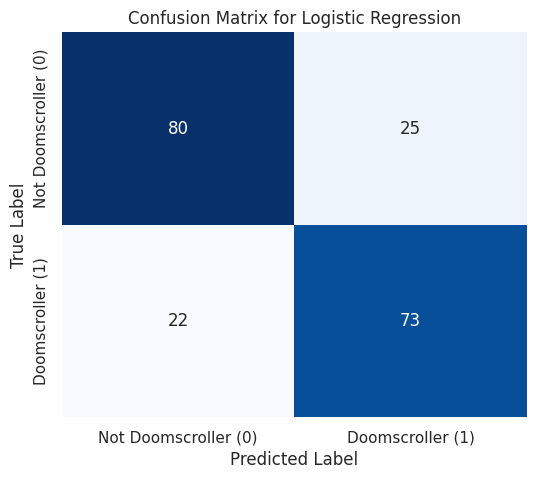


--- 5. LOGISTIC REGRESSION FEATURE COEFFICIENTS ---


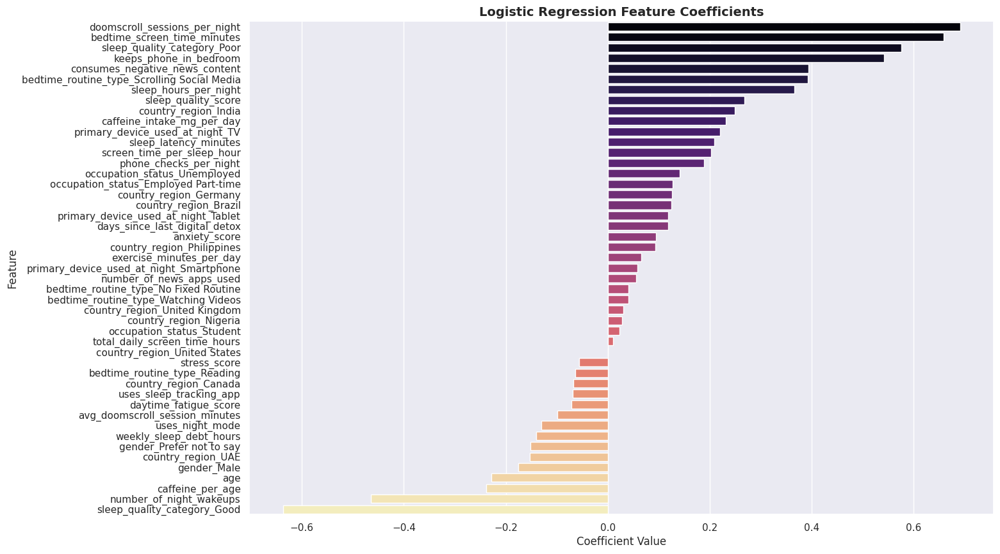

In [ ]:
# Making predictions on the test set
y_pred = log_reg_model.predict(X_test)

# Evaluating the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print("\nConfusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

# Visualizing the Confusion Matrix
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Not Doomscroller (0)', 'Doomscroller (1)'],
            yticklabels=['Not Doomscroller (0)', 'Doomscroller (1)'])
plt.title('Confusion Matrix for Logistic Regression')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("\n--- 5. LOGISTIC REGRESSION FEATURE COEFFICIENTS ---")

# Get feature coefficients from the trained Logistic Regression model
# log_reg_model.coef_[0] because it's a binary classification and coef_ is an array of arrays
coefficients = pd.Series(log_reg_model.coef_[0], index=X.columns).sort_values(ascending=False)

plt.figure(figsize=(15, 10))
sns.barplot(x=coefficients.values, y=coefficients.index, palette='magma')
plt.title('Logistic Regression Feature Coefficients', fontsize=14, fontweight='bold')
plt.xlabel('Coefficient Value', fontsize=12)
plt.ylabel('Feature', fontsize=12)
plt.show()

# Thank you